# **Spaceship Survival Game**



**Problem Statement:**
Developing a game where players control a spaceship navigating through an asteroid field. The objective is to avoid collisions with the asteroids for as long as possible. The game environment is represented as a 2D grid, where the spaceship can move up, down, left, or right. You can refer the following picture for an idea.

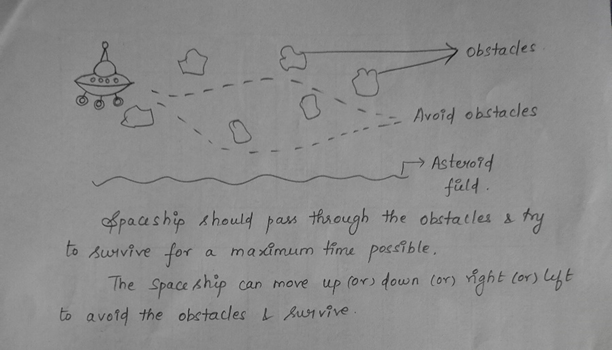

**Objective:** Design a deep neural network that takes the current state of the game environment (i.e., the positions of the spaceship and asteroids on the grid) as input and outputs the optimal action (i.e., move up, down, left, or right) to maximize the spaceship's survival time.

**Additional Information:**
*   The game environment is dynamic, with asteroids moving randomly across the grid.
*   The spaceship's movement speed and agility are constant.
*   The reward system is based on the survival time, with higher rewards for longer survival durations.
*   The neural network should use function approximation to learn the optimal policy for navigating the spaceship through the asteroid field.





**Solution** - To solve the problem of navigating a spaceship through an environment filled with asteroids using a deep neural network, we can use a reinforcement learning approach, particularly a Deep Q-Network (DQN). Here's an action plan to create a gaming environment and train a DQN to play the game:

- **Grid World:** The game takes place on a rectangular grid represented by a NumPy array.  The size of the grid can be customized during initialization.

- **Elements:**

  - **Spaceship:** Represented by the value 1 in the grid. The spaceship can move up, down, left, right, or stay in the same position. Its movement speed is also configurable.
  - **Asteroids:** Represented by the value -1 in the grid. Asteroids enter from the right of the grid and move left one step every time step. New asteroids are randomly generated at the right of the grid periodically.

- **Actions:** The agent can choose one of five actions:

  - 0: Stay in the same position
  - 1: Move Up
  - 2: Move Down
  - 3: Move Left
  - 4: Move Right

- **State and Observation:** The agent observes the entire game state as a 2D grid where the spaceship and asteroids are represented by their corresponding values (1 and -1).

- **Rewards:** The agent receives rewards based on its actions and the game state:

  - +1 reward for surviving each time step (encourages staying alive).
  - -0.5 penalty for staying still (encourages movement).
  - Small bonus reward that increases with the number of timesteps survived (encourages long-term survival).
  - Negative reward (default -10) for colliding with an asteroid (penalty for losing the game).

- **Termination:** The game ends when the spaceship collides with an asteroid.

- **Information Hidden from the Agent:** The agent doesn't have any information about the future positions of the asteroids or the exact number of new asteroids that will be generated. It has to rely on the current state (grid) to make decisions.

This is a relatively simple environment, but it can be challenging for an agent to learn due to the moving asteroids and the need to balance exploration (trying new actions) with exploitation (choosing actions known to be good).

In [4]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import itertools

(i)	**Environment Setup** - Define the game environment, including the state space, action space, rewards, and terminal conditions (e.g., when the spaceship is destroyed).

In [23]:
class Environment():
    """
    This class represents the gaming environment. It includes the grid, the spaceship, and the asteroids.
    """
    def __init__(self, grid_size=(10, 10), num_asteroids=1, spaceship_speed=1):
        """
        Initialize the environment with the given grid size, number of asteroids, and spaceship speed.
        """
        self.grid_size = grid_size
        self.num_asteroids = num_asteroids
        self.spaceship_speed = spaceship_speed
        self.time_step = 1
        self.reset()

    def reset(self):
        """
        Reset the game to its initial state.
        """
        self.grid = np.zeros(self.grid_size)  # Initialize grid with zeros
        self.spaceship_pos = (random.randint(0, self.grid_size[0]-1), random.randint(0, int(self.grid_size[1]/3)-1))
        self.generate_asteroids()
        self.steps_survived = 0
        self.time_step = 1
        self.game_over = False
        return self.get_state()

    def generate_asteroids(self):
        """
        Generate asteroids at random extreme right positions on the grid.
        """
        self.num_asteroids = random.randint(1, self.grid_size[0]-2)
        self.asteroids = set()
        while len(self.asteroids) < self.num_asteroids:
            asteroid_pos = (random.randint(0, self.grid_size[0]-1), self.grid_size[1]-1)
            if asteroid_pos != self.spaceship_pos:
                self.asteroids.add(asteroid_pos)

    def get_state(self):
        """
        Get the current state of the game, which includes the positions of the spaceship and asteroids.
        """
        state = np.zeros(self.grid_size)
        state[self.spaceship_pos[0], self.spaceship_pos[1]] = 1  # Spaceship position
        for asteroid_pos in self.asteroids:
            state[asteroid_pos[0], asteroid_pos[1]] = -1  # Asteroid positions
        return state

    def move_and_add_asteroids(self):
        """
        Move the asteroids one position to the left and add new asteroids every 3 time steps.
        """
        new_asteroids = set()
        for asteroid in self.asteroids:
            new_y = asteroid[1] - 1
            if new_y >= 0:
                new_asteroids.add((asteroid[0], new_y))
        if self.time_step % 3 == 0:
            # Add a new asteroid at a random x-coordinate and at the right edge of the grid
            new_asteroids.add((random.randint(0, self.grid_size[0]-1), self.grid_size[1]-1))
        self.asteroids = new_asteroids

    def step(self, action):
        """
        Perform the given action and return the new state, reward, and whether the game is over.

        """

        # Move asteroids one position to the left and generate new ones every 2 time steps
        self.move_and_add_asteroids()
        
        # Determine the new position of the spaceship based on the action
        if action == 0:  # Remain in same position
            new_pos = self.spaceship_pos
        if action == 1:  # Move up
            new_pos = (self.spaceship_pos[0] - self.spaceship_speed, self.spaceship_pos[1])
        elif action == 2:  # Move down
            new_pos = (self.spaceship_pos[0] + self.spaceship_speed, self.spaceship_pos[1])
        elif action == 3:  # Move left
            new_pos = (self.spaceship_pos[0], self.spaceship_pos[1] - self.spaceship_speed)
        elif action == 4:  # Move right
            new_pos = (self.spaceship_pos[0], self.spaceship_pos[1] + self.spaceship_speed)

        # Check for collisions with grid boundaries
        new_pos = (max(0, min(new_pos[0], self.grid_size[0]-1)), max(0, min(new_pos[1], self.grid_size[1]-1)))

        # Get the spaceship's x and y coordinates
        spaceship_x, spaceship_y = new_pos

        # Check if there's an asteroid to the left and the action is to move right
        if (spaceship_y, spaceship_x - 1) in self.asteroids and action == 4:
            self.game_over = True
            return self.get_state(), -10, True  # Return terminal state with negative reward

        # Check for collisions with asteroids
        if new_pos in self.asteroids:
            self.game_over = True
            # print("Game is already over. Please reset the game.")
            return self.get_state(), -10, True  # Return terminal state with negative reward


        self.time_step += 1

        self.spaceship_pos = new_pos
        self.steps_survived += 1

        # Define rewards based on various events
        reward = 1 # Reward for surviving a time step
        if action == 0:
            reward -= 0.5  # Penalty for not moving
        reward += self.time_step * 0.01  # Reward for surviving longer

        return self.get_state(), reward, False

    def render(self, state):
        """
        Render the current state of the game.
        """
        fig, ax = plt.subplots()

        # Create a 2D array to represent the colors of each cell
        grid = np.zeros((self.grid_size[0], self.grid_size[1], 3))
        spaceship_pos = None
        for i in range(self.grid_size[0]):
            for j in range(self.grid_size[1]):
                if state[i, j] == 1:  # spaceship is blue
                    spaceship_pos = (j, i)  # save spaceship position for later
                elif state[i, j] == -1:  # asteroids are red
                    grid[i, j] = [1, 0, 0]

        ax.imshow(grid)

        # Create a triangle patch for the spaceship
        if spaceship_pos is not None:
            spaceship_patch = patches.RegularPolygon(spaceship_pos, numVertices=3, radius=0.5, orientation=np.pi/6, color='blue')
            ax.add_patch(spaceship_patch)

        # Add labels for axes 
        ax.set_xlabel('X-axis')
        ax.set_ylabel('Y-axis')

        # Add a legend to distinguish spaceship and asteroids 
        legend_elements = [
            patches.Patch(color='blue', label='Spaceship'),
            patches.Patch(color='red', label='Asteroid'),
        ]
        ax.legend(handles=legend_elements)

        # Add gridlines for better visualization
        ax.grid(True)

        plt.show()

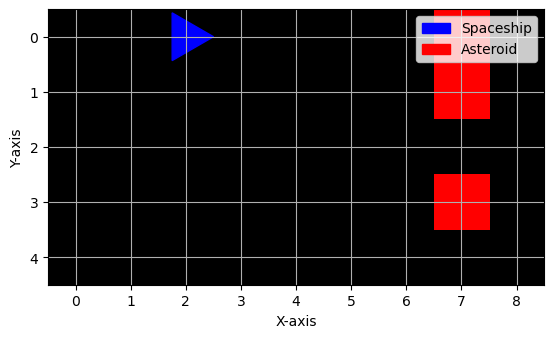

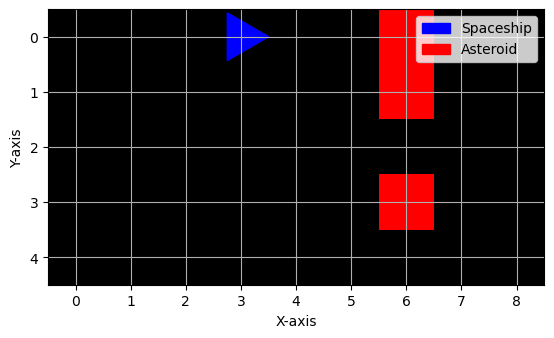

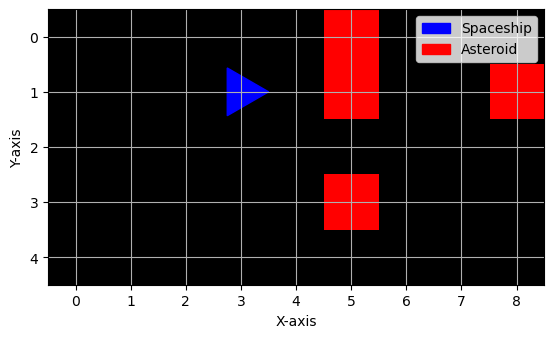

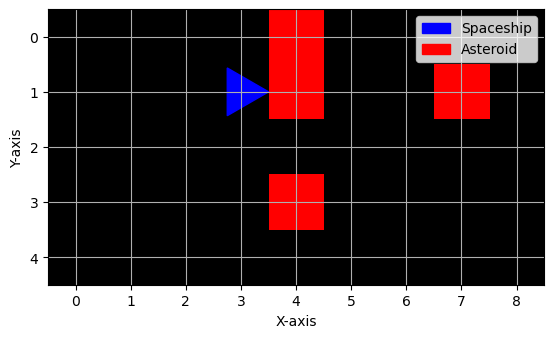

Game over!


In [26]:
# Create an instance of the Environment class with a grid size of 5x9 and a spaceship speed of 1
env = Environment(grid_size=(5, 9), spaceship_speed=1)

# Reset the environment and get the initial state
state = env.reset()

# Define a dictionary that maps action numbers to their string representations
action_dict = {
    0: 'Stay in the same position',
    1: 'Move Up',
    2: 'Move Down',
    3: 'Move Left',
    4: 'Move Right'
}

# Perform some actions
for i in range(8):
    # Choose a random action
    action = random.randint(1,4)
    
    # Perform the action and get the new state, reward, and whether the game is over
    state, reward, done = env.step(action)
    
    # print("Action:", action_dict[action], "Reward:", reward, "Done:", done, "\n state", state)
    # Render the current state of the game
    env.render(state)
    
    # If the game is over, print a message and break the loop
    if done:
        print("Game over!")
        break

(ii) **Replay Buffer** - Implement a replay buffer to store experiences (state, action, reward, next state, terminal flag).

In [13]:
class ReplayBuffer:
    """
    A class used to represent a Replay Buffer.

    """

    def __init__(self, buffer_size):
        """
        Constructs all the necessary attributes for the Replay Buffer object.

        """
        self.buffer_size = buffer_size
        self.buffer = deque(maxlen=buffer_size)  # Use deque with maximum length to automatically remove old experiences
    
    def push(self, experience):
        """
        Adds an experience to the buffer.

        """
        self.buffer.append(experience)  # Append new experience to the buffer
    
    def sample(self, batch_size):
        """
        Returns a sample from the buffer.

        """
        batch = random.sample(self.buffer, batch_size)  # Sample a batch of experiences from the buffer
        states, actions, rewards, next_states, terminals = zip(*batch)  # Unzip the batch into separate arrays
        return np.array(states), np.array(actions), np.array(rewards), np.array(next_states), np.array(terminals)
    
    def __len__(self):
        """
        Returns the current size of the buffer.

        """
        return len(self.buffer)

(iii) **Deep Q-Network Architecture:** Design the neural network architecture for the DQN using Convolutional Neural Networks. The input to the network is the game state, and the output is the Q-values for each possible action. 

In [14]:
class DQN(nn.Module):
    """
    A class used to represent a Deep Q-Network (DQN).

    """

    def __init__(self, input_dim, output_dim):
        """
        Constructs all the necessary attributes for the DQN object.

        """
        super(DQN, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim

        # Define the fully connected layers
        self.fc = nn.Sequential(
            nn.Linear(self.input_dim[0] * self.input_dim[1], 128),  # Linear layer with input_dim flattened and 128 output features
            nn.ReLU(),  # ReLU activation function
            nn.Linear(128, 256),  # Linear layer with 128 input features and 256 output features
            nn.ReLU(),  # ReLU activation function
            nn.Linear(256, self.output_dim)  # Linear layer with 256 input features and output_dim output features
        )

    def forward(self, state):
        """
        Performs the forward pass of the network.

        """
        # Flatten the state tensor starting from the first dimension
        state = state.flatten(start_dim=1)
        
        # Pass the state through the fully connected layers to get the Q-values
        q_values = self.fc(state)
        
        return q_values

(iv) **Epsilon-Greedy Exploration:** Implement an exploration strategy such as epsilon-greedy to balance exploration (trying new actions) and exploitation (using learned knowledge). 

In [15]:
class DQNAgent:
    """
    A class used to represent a Deep Q-Learning Agent.
    """

    def __init__(self, input_dim, output_dim, buffer_size=10000, batch_size=64, gamma=0.99, lr=0.001, epsilon_start=1.0, epsilon_end=0.01, epsilon_decay=0.995, target_update=10):
        """
        Constructs all the necessary attributes for the DQNAgent object.
        """
        # Initialize agent parameters
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.buffer_size = buffer_size
        self.batch_size = batch_size
        self.gamma = gamma
        self.lr = lr
        self.epsilon = epsilon_start
        self.epsilon_end = epsilon_end
        self.epsilon_decay = epsilon_decay

        # Initialize Q-network and target network
        self.model = DQN(self.input_dim, self.output_dim)
        self.target_model = DQN(self.input_dim, self.output_dim)
        self.update_target_network()  # Initialize target network weights to match Q-network

        # Initialize optimizer and loss function
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr)
        self.criterion = nn.MSELoss()

        # Initialize target network update frequency and counter
        self.target_update = target_update
        self.update_count = 0  # Count of update steps

        # Initialize replay buffer
        self.replay_buffer = ReplayBuffer(self.buffer_size)

    def select_action(self, state):
        """
        Returns the action selected by the agent.
        """
        # Epsilon-greedy action selection
        if np.random.rand() < self.epsilon:
            return np.random.choice(self.output_dim)  # Random action
        else:
            state = torch.FloatTensor(state).unsqueeze(0)
            with torch.no_grad():
                q_values = self.model(state)
            return q_values.argmax().item()  # Greedy action

    def update_target_network(self):
        """
        Updates the weights of the target network.
        """
        # Copy weights from Q-network to target network
        self.target_model.load_state_dict(self.model.state_dict())

    def update(self):
        """
        Performs a single update step on the Q-network.
        """
        # Increment update counter
        self.update_count += 1

        # Update target network weights every target_update steps
        if self.update_count % self.target_update == 0:
            self.update_target_network()

        # Return if not enough samples in replay buffer
        if len(self.replay_buffer.buffer) < self.batch_size:
            return

        # Sample a batch from the replay buffer
        states, actions, rewards, next_states, terminals = self.replay_buffer.sample(self.batch_size)

        # Convert to PyTorch tensors
        states = torch.FloatTensor(states)
        actions = torch.LongTensor(actions)
        rewards = torch.FloatTensor(rewards)
        next_states = torch.FloatTensor(next_states)
        terminals = torch.FloatTensor(terminals)

        # Compute current Q-values and target Q-values
        current_q_values = self.model(states).gather(1, actions.unsqueeze(1)).squeeze()
        next_q_values = self.target_model(next_states).max(1)[0]  # Use target network for next Q-values
        target_q_values = rewards + self.gamma * next_q_values * (1 - terminals)

        # Compute loss
        loss = self.criterion(current_q_values, target_q_values.detach())

        # Perform backpropagation
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        # Update target network weights after each learning step
        self.update_target_network()

        # Decay epsilon
        self.epsilon = max(self.epsilon_end, self.epsilon * self.epsilon_decay)

    def add_experience(self, state, action, reward, next_state, terminal):
        """
        Adds an experience to the replay buffer and performs an update step if possible.
        """
        # Add experience to replay buffer
        self.replay_buffer.push((state, action, reward, next_state, terminal))
        
        # Perform update step if enough samples in replay buffer
        if len(self.replay_buffer.buffer) >= self.batch_size:
            self.update()

(v) **Training Loop:** Initialize the DQN and the target network (a separate network used to stabilize training). In each episode, reset the environment and observe the initial state.

In [16]:
def train_dqn_agent(agent, env, num_episodes=2000, eps_start=1.0, eps_end=0.01, eps_decay=0.995, target_update=10, avg_reward_window=100):
    """
    Function to train a DQN agent.
    """

    episode_rewards = []  # List to store the total reward for each episode
    average_rewards = []  # List to store the average reward per episode window

    agent.epsilon = eps_start  # Set the starting epsilon

    for episode in range(num_episodes):
        # Reset the environment and get the initial state
        state = env.reset()

        total_reward = 0  # Variable to store the total reward for the episode

        # Loop for each step in the episode
        for step in itertools.count():
            # The agent selects an action
            action = agent.select_action(state)

            # The agent performs the action and gets the reward and next state
            next_state, reward, done = env.step(action)

            # The agent stores the experience in its replay buffer
            agent.add_experience(state, action, reward, next_state, done)

            # The state is updated
            state = next_state

            total_reward += reward  # Update the total reward

            # If the episode is done, break the loop
            if done:
                break

        # Decay epsilon
        agent.epsilon = max(eps_end, eps_decay * agent.epsilon)

        # Update the target network every target_update episodes
        if episode % target_update == 0:
            agent.update_target_network()

        # Store the total reward for the episode
        episode_rewards.append(round(total_reward, 2))

        # Calculate and store average reward for a window of episodes (e.g., last avg_reward_window)
        if len(episode_rewards) > avg_reward_window:
            average_reward = sum(episode_rewards[-avg_reward_window:]) / avg_reward_window
        else:
            average_reward = sum(episode_rewards) / len(episode_rewards)
        average_rewards.append(average_reward)

        # Print training details with average reward
        print(f"Episode: {episode+1}/{num_episodes}, Total reward: {round(total_reward,2)}, Average Reward (last {avg_reward_window}): {average_reward:.2f}, Epsilon: {agent.epsilon:.2f}")

    # Plot the total reward, average reward per episode, and loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(average_rewards, label=f'Average Reward (last {avg_reward_window})')
    plt.xlabel('Episode')
    plt.ylabel('Reward')
    plt.legend()

    return agent

Episode: 1/200, Total reward: 7.52, Average Reward (last 10): 7.52, Epsilon: 0.99
Episode: 2/200, Total reward: 11.52, Average Reward (last 10): 9.52, Epsilon: 0.99
Episode: 3/200, Total reward: 37.84, Average Reward (last 10): 18.96, Epsilon: 0.89
Episode: 4/200, Total reward: 12.25, Average Reward (last 10): 17.28, Epsilon: 0.79
Episode: 5/200, Total reward: -3.73, Average Reward (last 10): 13.08, Epsilon: 0.76
Episode: 6/200, Total reward: -2.06, Average Reward (last 10): 10.56, Epsilon: 0.72
Episode: 7/200, Total reward: -2.06, Average Reward (last 10): 8.75, Epsilon: 0.68
Episode: 8/200, Total reward: 44.3, Average Reward (last 10): 13.20, Epsilon: 0.54
Episode: 9/200, Total reward: 0.15, Average Reward (last 10): 11.75, Epsilon: 0.51
Episode: 10/200, Total reward: -0.46, Average Reward (last 10): 10.53, Epsilon: 0.48
Episode: 11/200, Total reward: 37.45, Average Reward (last 10): 13.52, Epsilon: 0.39
Episode: 12/200, Total reward: 6.52, Average Reward (last 10): 13.02, Epsilon: 0

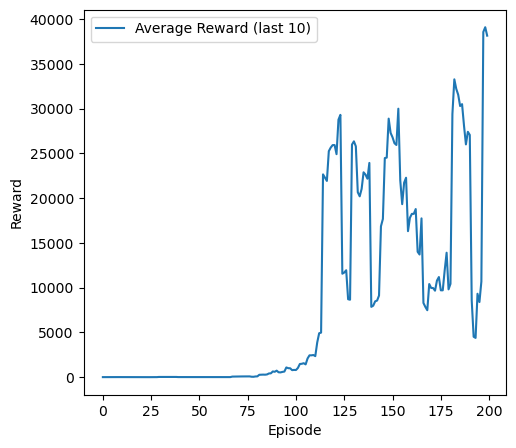

In [17]:
# Initialize the environment and the agent
env = Environment(grid_size=(5, 9))
input_dim = env.grid_size 
agent = DQNAgent(input_dim, 5)

# Train the agent
agent = train_dqn_agent(agent, env, num_episodes=200, avg_reward_window=10)

(vi) **Testing and Evaluation:**
- After training, evaluate the DQN by running it in the environment without exploration (set epsilon to 0).
- Monitor metrics such as average reward per episode, survival time, etc., to assess the performance. 

In [40]:
def evaluate_dqn_agent(agent, env, num_episodes=2):
    """
    Evaluate a DQN agent.

    """
    total_rewards = []  # List to store the total reward for each episode
    survival_times = []  # List to store the survival time for each episode

    # Set epsilon to 0 to disable exploration
    agent.epsilon = 0

    for episode in range(num_episodes):
        # Reset the environment and get the initial state
        state = env.reset()

        total_reward = 0  # Variable to store the total reward for the episode

        # Loop for each step in the episode
        for step in itertools.count():
            # The agent selects an action
            action = agent.select_action(state)

            # The agent performs the action
            next_state, reward, done = env.step(action)

            # The state is updated
            state = next_state

            total_reward += reward  # Update the total reward

            env.render(state)
            
            # If the game is over or the step count exceeds 100, print a message and break the loop
            if done or step > 1000:
                # print("Game over!")
                break

        total_rewards.append(total_reward)  # Store the total reward for the episode
        survival_times.append(step)  # Store the survival time for the episode
        print(f"Episode: {episode+1}/{num_episodes}, Total reward: {round(total_reward,2)}, Survival time: {step}")

    # Calculate the average reward per episode and the average survival time
    avg_reward = sum(total_rewards) / num_episodes
    avg_survival_time = sum(survival_times) / num_episodes

    return avg_reward, avg_survival_time

In [35]:
# Evaluate the agent (limiting step to 1000 since the survival time is terminate is huge)
avg_reward, avg_survival_time = evaluate_dqn_agent(agent, env)

# Print the evaluation results
print("\nAverage Reward per Episode:", round(avg_reward,2),  "Average Survival Time:", avg_survival_time) # comment out 'env.render(state)' line in 'evaluate_dqn_agent' function to not print image

Episode: 1/5, Total reward: 5981.55, Survival time: 1001
Episode: 2/5, Total reward: 5973.55, Survival time: 1001
Episode: 3/5, Total reward: 5967.05, Survival time: 1001
Episode: 4/5, Total reward: -3.65, Survival time: 7
Episode: 5/5, Total reward: 5980.05, Survival time: 1001

Average Reward per Episode: 4779.71 Average Survival Time: 802.2


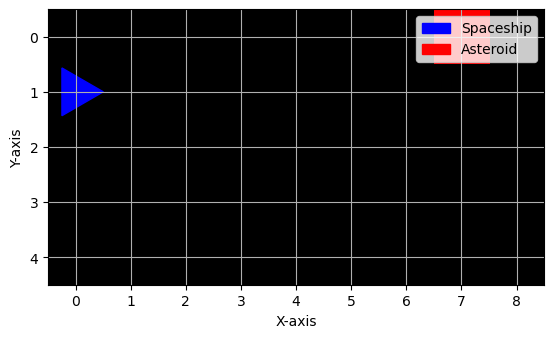

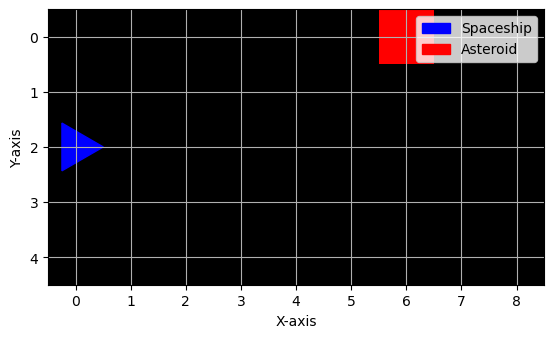

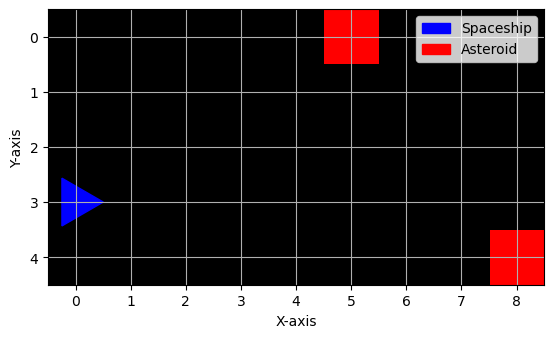

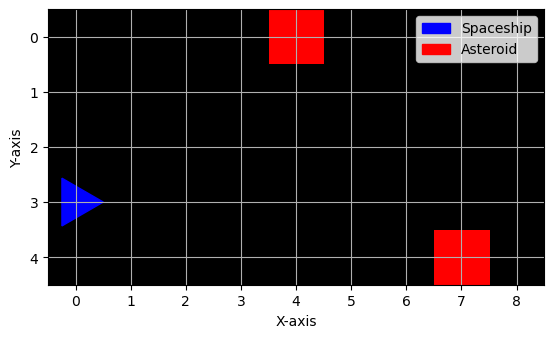

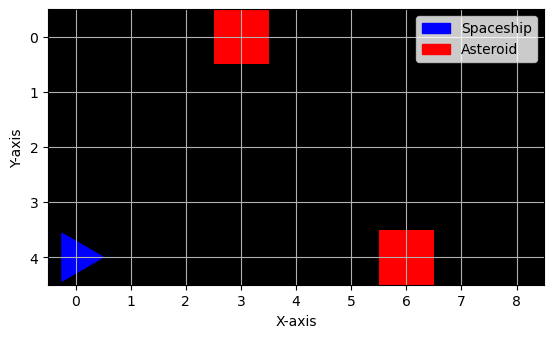

...

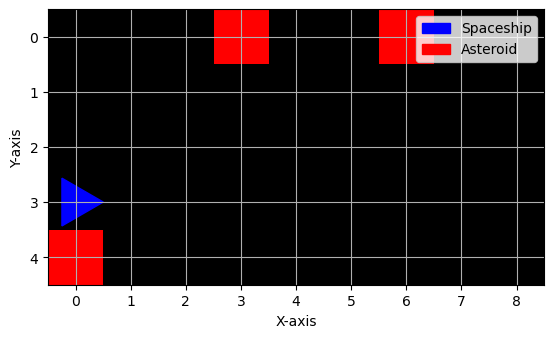

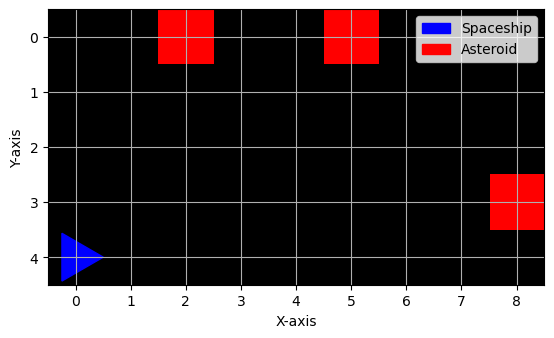

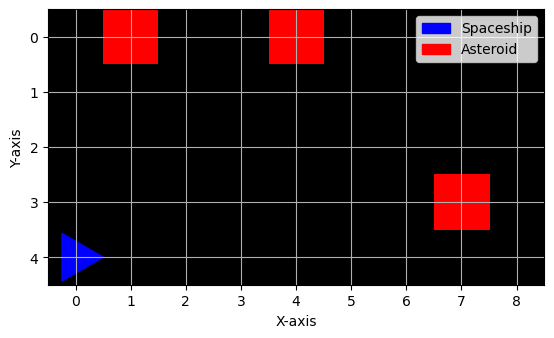

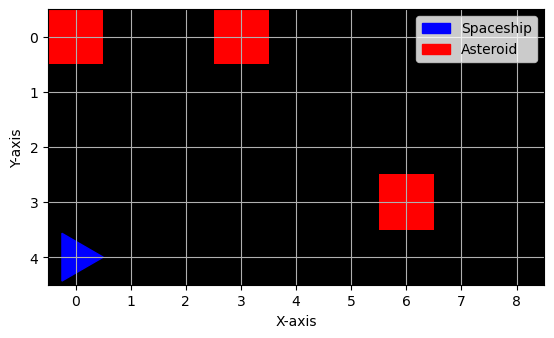

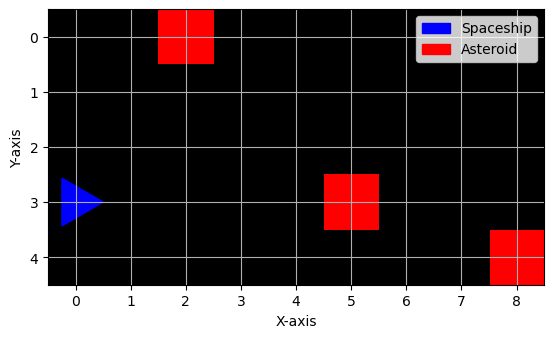

Episode: 1/2, Total reward: 5966.05, Survival time: 1001


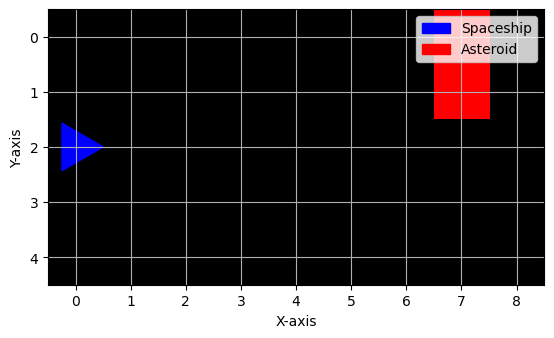

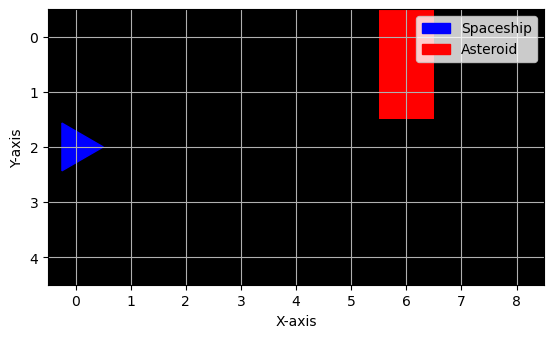

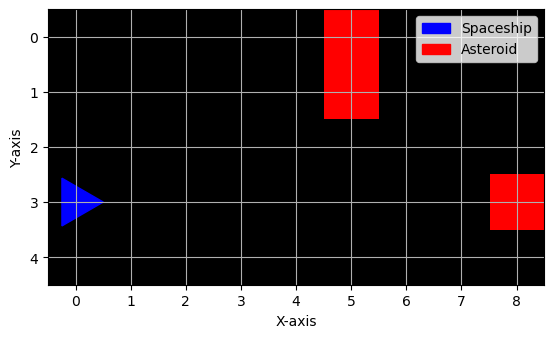

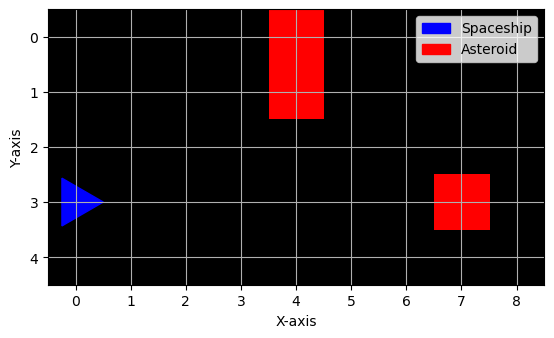

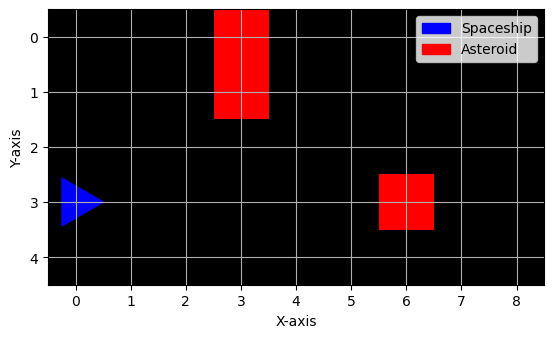

...

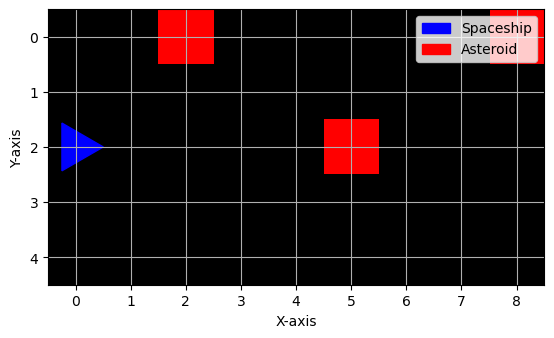

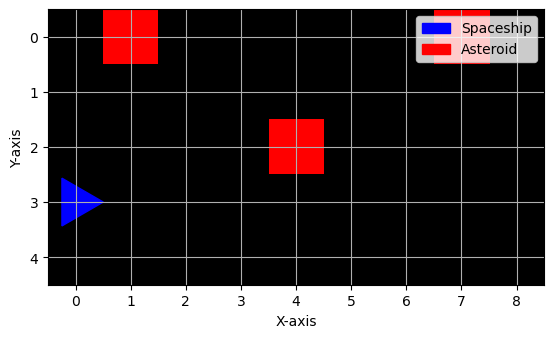

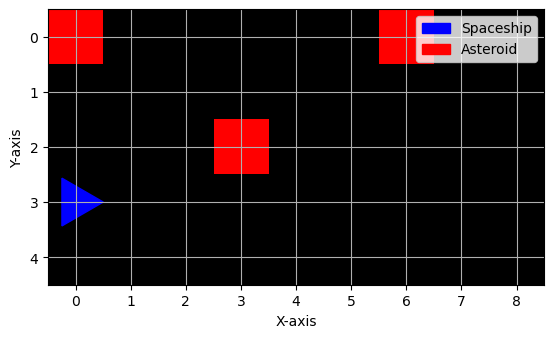

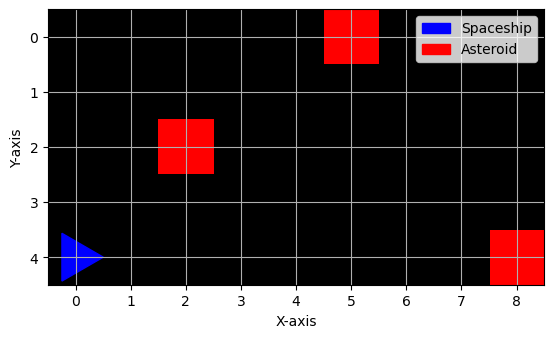

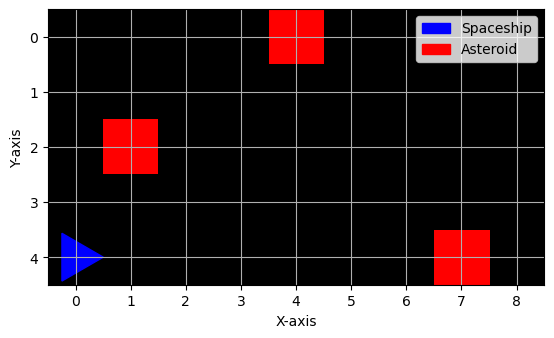


KeyboardInterrupt



In [41]:
# Evaluate the agent (limiting step to 1000 since the survival time is terminate is huge)
avg_reward, avg_survival_time = evaluate_dqn_agent(agent, env)

# Print the evaluation results
print("\nAverage Reward per Episode:", round(avg_reward,2),  "Average Survival Time:", avg_survival_time) # comment out 'env.render(state)' line in 'evaluate_dqn_agent' function to not print image